In [9]:
import os
import glob
import numpy as np
import random
import matplotlib.pyplot as plt
import plotly.express as px
import wandb
import cv2
import copy

import torch
from torch import nn
from torchinfo import summary
from torchvision.models import vgg19
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision.io import read_image, ImageReadMode
import torch.nn.functional as F
import torchvision.transforms.functional as TF
import torchvision.transforms as transforms

In [10]:
config = {
    "lr": 1e-4,
    "max_iter": 10,
    "logging_interval": 5,
    "preview_interval": 5,
    "batch_size": 8,
    "activations": "ReLU",
    "optimizer": "Adam",
}

In [11]:
device = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"
# device = 'cpu'
print(f"Using {device} device")

Using mps device


In [12]:
use_wandb = False
if use_wandb:
    wandb.login()
    wandb.init(project="assignment-3", name="", reinit=True, config=config)

# Style Transfer

[Arbitrary Style Transfer in Real-time with Adaptive Instance Normalization
](https://arxiv.org/pdf/1703.06868v2.pdf)

content dataset

- [https://cocodataset.org/#download](https://cocodataset.org/#download)

style dataset

- [https://www.kaggle.com/competitions/painter-by-numbers/data](https://www.kaggle.com/competitions/painter-by-numbers/data)

## Data

In [13]:
style_imgs = glob.glob('data/styles/*.jpg')
content_imgs = glob.glob('data/content/*.jpg')

In [14]:
print(style_imgs[:5])
print(content_imgs[:5])

['data/styles/9733.jpg', 'data/styles/91159.jpg', 'data/styles/96636.jpg', 'data/styles/97528.jpg', 'data/styles/90247.jpg']
['data/content/000000182611.jpg', 'data/content/000000335177.jpg', 'data/content/000000278705.jpg', 'data/content/000000463618.jpg', 'data/content/000000568981.jpg']


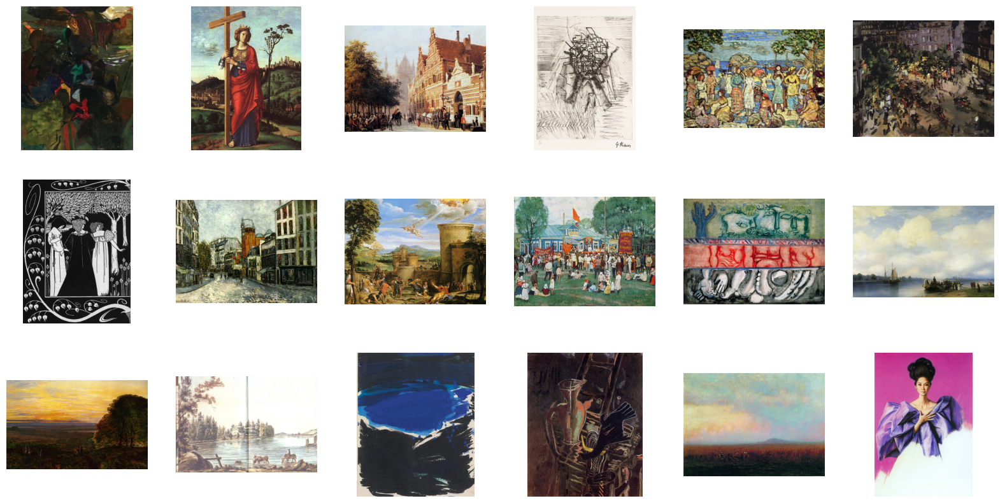

In [15]:
fig, axs = plt.subplots(3, 6, figsize=(20, 10))
axs = axs.flatten()

for i, file in enumerate(style_imgs[32:50]):
    img = cv2.imread(file)
    axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[i].axis('off')
plt.show()

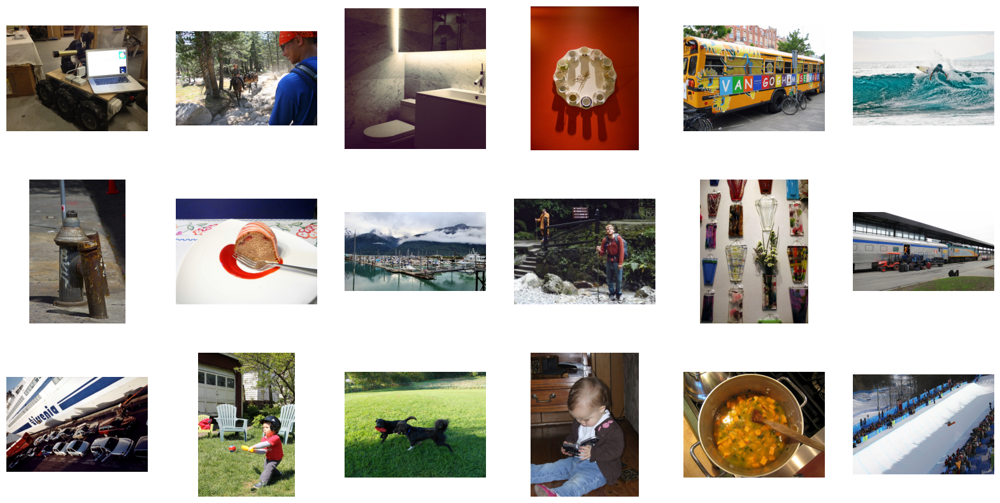

In [16]:
fig, axs = plt.subplots(3, 6, figsize=(20, 10))
axs = axs.flatten()

for i, file in enumerate(content_imgs[32:50]):
    img = cv2.imread(file)
    axs[i].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    axs[i].axis('off')
plt.show()

In [17]:
class StyleContentDataset(Dataset):
    def __init__(self, style_imgs, content_imgs, transform=None, normalize=None):
        self.style_imgs = style_imgs
        self.content_imgs = content_imgs
        self.transform = transform
        self.normalize = normalize

    def __len__(self):
        if len(self.style_imgs) < len(self.content_imgs):
            return len(self.style_imgs)
        else:
            return len(self.content_imgs)
    
    def __getitem__(self, idx):
        style = read_image(self.style_imgs[idx], ImageReadMode.RGB).float() / 255.0
        content = read_image(self.content_imgs[idx], ImageReadMode.RGB).float() / 255.0

        if self.normalize:
            style = self.normalize(style)
            content = self.normalize(content)
        
        if self.transform:
            style = self.transform(style)
            content = self.transform(content)
        
        return style, content
    

In [18]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
transform = transforms.Compose([transforms.Resize(256), transforms.RandomCrop(256)])

train_dataset = StyleContentDataset(style_imgs[:10], content_imgs[:10], transform=transform, normalize=norm)

In [19]:
style, content = train_dataset[9]

In [20]:
def denorm_img(img: torch.Tensor):
    std = torch.Tensor([0.229, 0.224, 0.225]).reshape(-1, 1, 1)
    mean = torch.Tensor([0.485, 0.456, 0.406]).reshape(-1, 1, 1)
    return torch.clip(img * std + mean, min=0, max=1)

In [21]:
class DataStore():
    def __init__(self, dataset, batch_size, shuffle=False):
        self.dataset = dataset
        self.dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)
        self.iterator = iter(self.dataloader)

    def get(self):
        try:
           style, content = next(self.iterator)
        except (StopIteration):
            # print('| Repeating |')
            self.iterator = iter(self.dataloader)
            style, content = next(self.iterator)
        
        return style, content

## AdaIN

In [22]:
def mi(x):
    return torch.sum(x, dim=(2, 3), keepdim=True) / (x.shape[2] * x.shape[3])

def sigma(x, epsilon=1e-5):
    return torch.sqrt(torch.sum(((x - mi(x))**2 + epsilon), dim=(2, 3), keepdim=True) / (x.shape[2] * x.shape[3]))

In [23]:
class AdaIN(nn.Module):
    def __init__(self, epsilon=1e-5):
        super().__init__()
        self.epsilon = epsilon
    
    # [batch, channels, heigth, width]
    # def mi(self, x):
    #     return torch.sum(x, dim=(2, 3), keepdim=True) / (x.shape[2] * x.shape[3])

    # def sigma(self, x):
    #     return torch.sqrt(torch.sum(((x - self.mi(x))**2 + self.epsilon), dim=(2, 3), keepdim=True) / (x.shape[2] * x.shape[3]))

    def forward(self, content, style):
        # return (torch.mul(self.sigma(style), ((content - self.mi(content)) / self.sigma(content))) + self.mi(style))
        return (torch.mul(sigma(style, self.epsilon), ((content - mi(content)) / sigma(content, self.epsilon))) + mi(style))


## Style and Content loss

In [24]:
class Loss(nn.Module):
    def __init__(self, lamb=8):
        super().__init__()
        self.lamb = lamb

    def content_loss(self, enc_out, t):
        # print(torch.linalg.norm(enc_out - t))
        # print(F.mse_loss(enc_out, t))
        # return torch.linalg.norm(enc_out - t)
        return F.mse_loss(enc_out, t)
    
    def style_loss(self, out_activations, style_activations):
        means, sds = 0, 0
        for out_act, style_act in zip(out_activations.values(), style_activations.values()):
            # means = torch.linalg.norm(mi(out_act) - mi(style_act))
            # sds = torch.linalg.norm(sigma(out_act) - sigma(style_act))
            # print(means, sds)
            
            means += F.mse_loss(mi(out_act), mi(style_act))
            sds += F.mse_loss(sigma(out_act), sigma(style_act))
            # print(means, sds)
        return means + sds

    def forward(self, enc_out, t, out_activations, style_activations):
        self.loss_c = self.content_loss(enc_out, t) / t.shape[0]
        self.loss_s = self.style_loss(out_activations, style_activations) / t.shape[0]

        # print(self.loss_c)
        # print(self.loss_s)
        # print(self.loss_c + self.lamb * self.loss_s)
        
        return (self.loss_c + self.lamb * self.loss_s)

## Model

In [25]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = list(vgg19(weights='VGG19_Weights.DEFAULT').children())[0][:21]

        # freeze the encoder
        for param in self.encoder.parameters():
            param.requires_grad = False
        
        # create dict for saving the activations used in the style loss
        self.activations = {}
        for i, module in enumerate(self.encoder.children()):
            if i in [1, 6, 11, 20]:
                module.register_forward_hook(self._save_activation(i))
                # print(i, module)
        
        self.AdaIN = AdaIN()
        self.decoder = nn.Sequential(
            nn.Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Upsample(scale_factor=2.0, mode='nearest'),

            nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Upsample(scale_factor=2.0, mode='nearest'),
            
            nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Upsample(scale_factor=2.0, mode='nearest'),
            
            nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            nn.ReLU(),
            nn.Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode='reflect'),
            # nn.ReLU(), # tu mozno nieco ine, kedze to uz je finalny vystup
        )

    # https://stackoverflow.com/a/68854535
    def _save_activation(self, name):
        def hook(module, input, output):
            self.activations[name] = output.detach()
        return hook

    def forward(self, content, style):
        enc_content = self.encoder(content)
        enc_style = self.encoder(style)
        
        self.t = self.AdaIN(enc_content, enc_style)
        out = self.decoder(self.t)
        #out_t = self.encoder(out)
        
        return out
    
model = NeuralNetwork().to(device)
summary(model)

Layer (type:depth-idx)                   Param #
NeuralNetwork                            --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       (1,792)
│    └─ReLU: 2-2                         --
│    └─Conv2d: 2-3                       (36,928)
│    └─ReLU: 2-4                         --
│    └─MaxPool2d: 2-5                    --
│    └─Conv2d: 2-6                       (73,856)
│    └─ReLU: 2-7                         --
│    └─Conv2d: 2-8                       (147,584)
│    └─ReLU: 2-9                         --
│    └─MaxPool2d: 2-10                   --
│    └─Conv2d: 2-11                      (295,168)
│    └─ReLU: 2-12                        --
│    └─Conv2d: 2-13                      (590,080)
│    └─ReLU: 2-14                        --
│    └─Conv2d: 2-15                      (590,080)
│    └─ReLU: 2-16                        --
│    └─Conv2d: 2-17                      (590,080)
│    └─ReLU: 2-18                        --
│    └─MaxPool2d: 2

In [26]:
model.activations

{}

### Configure forward hooks to save activations

In [107]:
# activations = {}
# layers = [1, 6, 11, 20]

In [108]:
# def save_activation(name, activations):
#     def hook(module, input, output):
#         activations[name] = output.detach()
#     return hook

In [109]:
# activations = {}
# for i, module in enumerate(model.encoder.children()):
#     if i in layers:
#         module.register_forward_hook(save_activation(i, activations))
#         # print(i, module)

## Training

In [110]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
transform = transforms.Compose([transforms.Resize(256), transforms.RandomCrop(256)])

In [111]:
style_imgs = glob.glob('data/styles/*.jpg')
content_imgs = glob.glob('data/content/*.jpg')

train_dataset = StyleContentDataset(style_imgs[:1000], content_imgs[:1000], transform=transform, normalize=norm)

In [112]:
preview_style_imgs = glob.glob('data/preview/style/*.jpg')
preview_content_imgs = glob.glob('data/preview/content/*.jpg')

preview_dataset = StyleContentDataset(preview_style_imgs, preview_content_imgs, transform=transform, normalize=norm)

In [113]:
def train_one_iter(datastore, model, optimizer, loss_fn: Loss):
    model.train()
    
    style, content = datastore.get()
    style, content = style.to(device), content.to(device)

    # Forward
    out = model(content, style)

    # Save activations
    style_activations = copy.deepcopy(model.activations)
    
    enc_out = model.encoder(out)
    out_activations = model.activations

    # Compute loss
    loss = loss_fn(enc_out, model.t, out_activations, style_activations)

    # Update parameters
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    return loss.item(), loss_fn.loss_c.item(), loss_fn.loss_s.item()

In [114]:
if not os.path.isdir('outputs'):
    os.mkdir('outputs')

In [27]:
def preview(model, datastore, iteration, save=False, use_wandb=False):
    model.eval()
    with torch.no_grad():
        np.random.shuffle(datastore.dataset.style_imgs)
        # np.random.shuffle(datastore.dataset.content_imgs)
        
        style, content = datastore.get()
        # style, content = style.to('cpu'), content.to('cpu')
        style, content = style.to(device), content.to(device)
        out = model(content, style)
        
        fig, axs = plt.subplots(8, 6, figsize=(20, 26))
        axs = axs.flatten()
        i = 0
        for (s, c, o) in zip(style, content, out): # style, content, out
            axs[i].imshow(denorm_img(s.cpu()).permute(1, 2, 0))
            axs[i].axis('off')
            axs[i].set_title('style')
            axs[i+1].imshow(denorm_img(c.cpu()).permute(1, 2, 0))
            axs[i+1].axis('off')
            axs[i+1].set_title('content')
            axs[i+2].imshow(denorm_img(o.cpu()).permute(1, 2, 0))
            axs[i+2].axis('off')
            axs[i+2].set_title('output')
            i += 3

        if save:
            fig.savefig(f'outputs/{iteration}_preview.png')
            plt.close(fig)
        else:
            plt.show()
        
        if use_wandb:
            wandb.log({f'{iteration}_preview': wandb.Image(f'outputs/{iteration}_preview.png')})    

In [44]:
def train():
    train_history = {'style_loss': [], 'content_loss': [], 'loss': []}

    datastore = DataStore(train_dataset, batch_size=config['batch_size'], shuffle=False)
    preview_datastore = DataStore(preview_dataset, batch_size=len(preview_dataset), shuffle=False)

    optimizer = torch.optim.Adam(model.parameters(), lr=config['lr'])
    loss_fn = Loss()

    for i in range(config['max_iter']):
        loss, content_loss, style_loss = train_one_iter(datastore, model, optimizer, loss_fn)
        train_history['loss'].append(loss)
        train_history['style_loss'].append(style_loss)
        train_history['content_loss'].append(content_loss)

        if i%config['logging_interval'] == 0:
            print(f'iter: {i}')
            print(f'loss: {loss:>5f}, style loss: {style_loss:>5f}, content loss: {content_loss:>5f}')
            print('-------------------------------')

            if use_wandb:
                print(i)
                wandb.log({
                    'iter': i, 'loss': loss, 'style_loss': style_loss, 'content_loss': content_loss
                })
                
        if i%config['preview_interval'] == 0:
            preview(model, preview_datastore, i, save=True, use_wandb=use_wandb)
        
    return train_history


In [116]:
history = train()

Iter 0
loss: 48.817799, style loss: 3.075086, content loss: 5.717839
-------------------------------
Iter 5
loss: 29.422987, style loss: 1.909700, content loss: 3.439161
-------------------------------


In [117]:
torch.save(model.state_dict(), 'outputs/model.pt')
if use_wandb:
    artifact = wandb.Artifact('model', type='model')
    artifact.add_file('outputs/model.pt')
    wandb.log_artifact(artifact)
    wandb.finish()

content_loss,█▁
iter,▁█
loss,█▁
style_loss,█▁
content_loss,3.43916
iter,5
loss,29.42299
style_loss,1.9097


In [118]:
fig = px.line({'loss': history['loss'], 'style_loss': history['style_loss'], 'content_loss': history['content_loss']})
fig.show()

## Evaluation

In [31]:
model = NeuralNetwork()
model.load_state_dict(torch.load('models/model_10k.pt', map_location=torch.device(device)))
model.to(device)

NeuralNetwork(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1,

In [44]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
transform = transforms.Compose([transforms.Resize(256), transforms.CenterCrop(256)])

preview_style_imgs = glob.glob('data/preview/style/*.jpg')
preview_content_imgs = glob.glob('data/preview/content/*.jpg')

eval_dataset = StyleContentDataset(preview_style_imgs, [preview_content_imgs[8] for i in range(len(preview_style_imgs))], transform=transform, normalize=norm)
# eval_dataset = StyleContentDataset([preview_style_imgs[2]], [preview_content_imgs[2]], transform=transform, normalize=norm)

eval_datastore = DataStore(eval_dataset, batch_size=len(eval_dataset), shuffle=False)

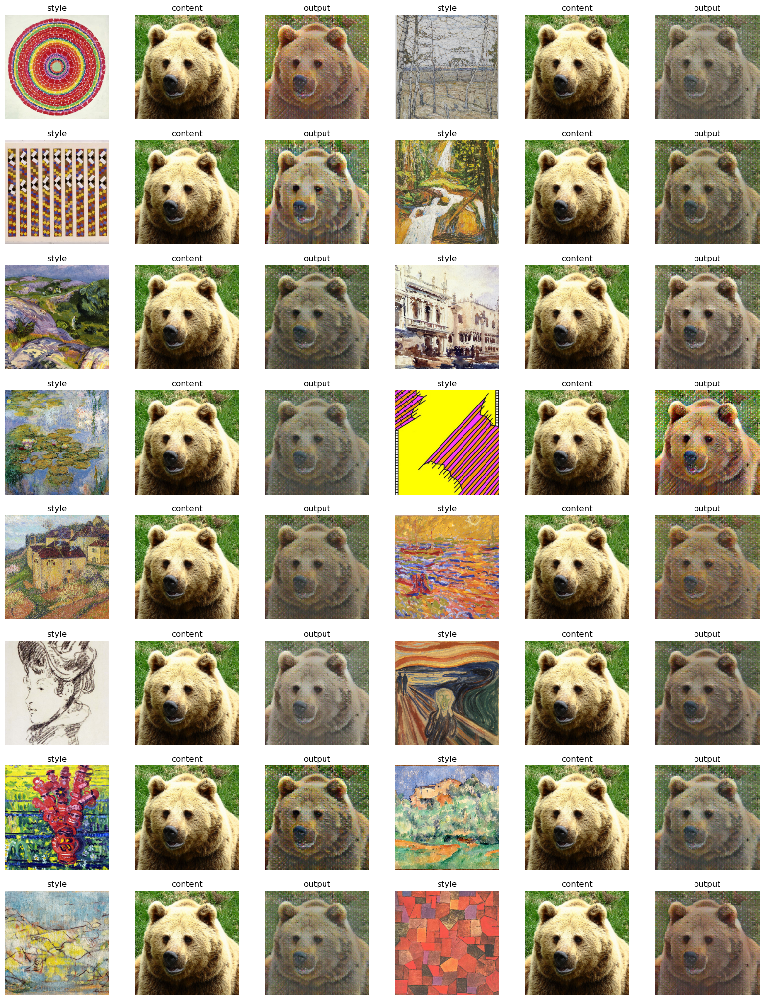

In [45]:
preview(model, eval_datastore, 0, save=False, use_wandb=False)

### Experiments

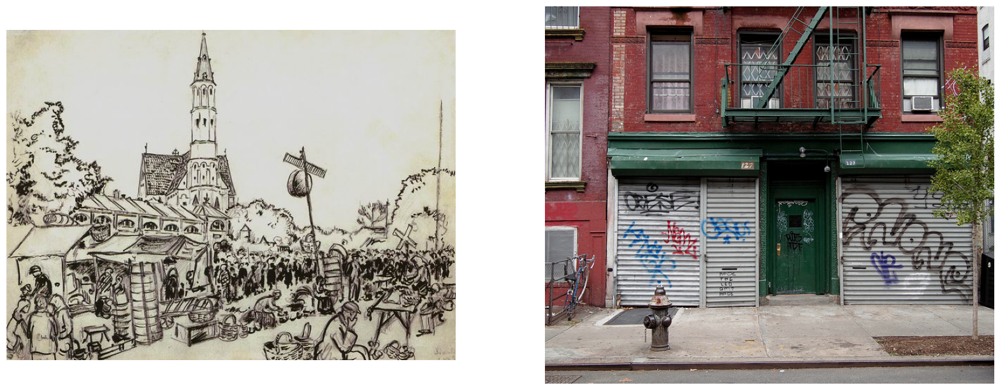

In [ ]:
norm = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
transform = transforms.Compose([transforms.Resize(256), transforms.RandomCrop(256)])

with torch.no_grad():
    # ds = DataStore(train_dataset, batch_size=1)

    style = read_image('data/styles/9.jpg', ImageReadMode.RGB).float() / 255.0
    content = read_image('data/content/000000008899.jpg', ImageReadMode.RGB).float() / 255.0

    plot_pair(style, content)

    style = style.unsqueeze(0)
    content = content.unsqueeze(0)

    style = norm(style)
    content = norm(content)
    
    style, content = style.to(device), content.to(device)

    out = model(content, style)

(-0.5, 639.5, 535.5, -0.5)

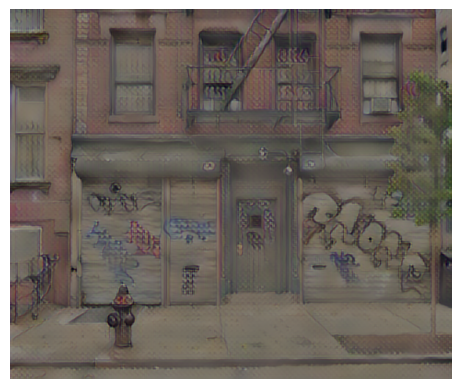

In [ ]:
out = out.cpu()

denorm_out = denorm_img(out)
plt.imshow(denorm_out[0].permute(1, 2, 0))
plt.axis(False)

(-0.5, 639.5, 535.5, -0.5)

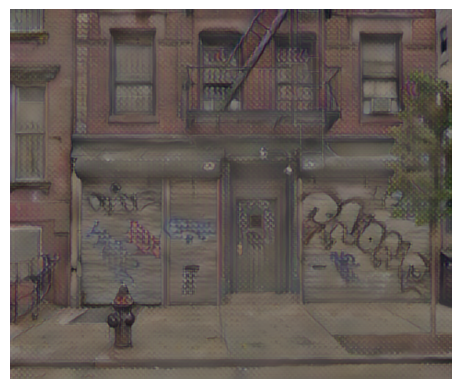

In [ ]:
out = out.cpu()

denorm_out = denorm_img(out)
plt.imshow(denorm_out[0].permute(1, 2, 0))
plt.axis(False)

(-0.5, 639.5, 535.5, -0.5)

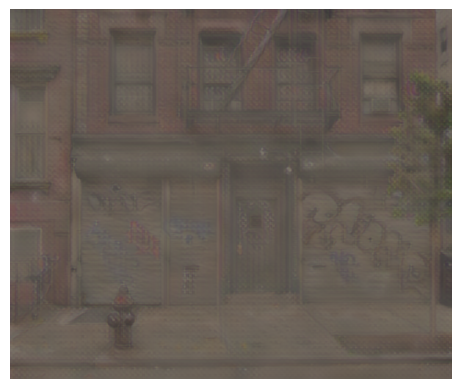

In [ ]:
out = out.cpu()

denorm_out = denorm_img(out)
plt.imshow(denorm_out[0].permute(1, 2, 0))
plt.axis(False)

## Playground

### Testing random stuff 

In [ ]:
model = torch.hub.load('pytorch/vision:v0.10.0', 'vgg19', pretrained=True)
summary(model)

Using cache found in /Users/kuko/.cache/torch/hub/pytorch_vision_v0.10.0
/Users/kuko/miniconda3/envs/cv/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/kuko/miniconda3/envs/cv/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer (type:depth-idx)                   Param #
VGG                                      --
├─Sequential: 1-1                        --
│    └─Conv2d: 2-1                       1,792
│    └─ReLU: 2-2                         --
│    └─Conv2d: 2-3                       36,928
│    └─ReLU: 2-4                         --
│    └─MaxPool2d: 2-5                    --
│    └─Conv2d: 2-6                       73,856
│    └─ReLU: 2-7                         --
│    └─Conv2d: 2-8                       147,584
│    └─ReLU: 2-9                         --
│    └─MaxPool2d: 2-10                   --
│    └─Conv2d: 2-11                      295,168
│    └─ReLU: 2-12                        --
│    └─Conv2d: 2-13                      590,080
│    └─ReLU: 2-14                        --
│    └─Conv2d: 2-15                      590,080
│    └─ReLU: 2-16                        --
│    └─Conv2d: 2-17                      590,080
│    └─ReLU: 2-18                        --
│    └─MaxPool2d: 2-19             

In [ ]:
sliced_vgg = list(model.children())[0][:21]

In [ ]:
arr = np.random.randint(1, 10, (2, 3, 4, 4))

In [ ]:
i, j = 1, 1
for layer in sliced_vgg:
    print(f'{i}_{j} {layer}')
    j += 1
    if str(layer)[0] == 'M':
        j = 1
        i += 1
        print()

1_1 Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1_2 ReLU(inplace=True)
1_3 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1_4 ReLU(inplace=True)
1_5 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

2_1 Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_2 ReLU(inplace=True)
2_3 Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_4 ReLU(inplace=True)
2_5 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

3_1 Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_2 ReLU(inplace=True)
3_3 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_4 ReLU(inplace=True)
3_5 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_6 ReLU(inplace=True)
3_7 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_8 ReLU(inplace=True)
3_9 MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)

4_1 Co

In [ ]:
reversed_encoder = list(reversed(sliced_vgg))

In [ ]:
#decoder = reversed(sliced_vgg)

decoder = []

for i, layer in enumerate(reversed_encoder):
    if type(layer) == nn.MaxPool2d:
        decoder[i] = nn.Upsample(scale_factor=2, mode='nearest')
    
    elif type(layer) == nn.Conv2d:
        tmp = layer.in_channels 
        layer.in_channels = layer.out_channels
        layer.out_channels = tmp
    
    elif type(layer) == nn.Conv2d:
        tmp = layer.in_channels 
        layer.in_channels = layer.out_channels
        layer.out_channels = tmp

        # if type(decoder[i-1] == nn.ReLU):
        #     tmp = layer
        #     #print(i, i+1)
        #     decoder[i] = decoder[i-1]
        #     decoder[i-1] = tmp

    # elif type(layer) == nn.ReLU and type(decoder[i+1]) == nn.Conv2d:
    #     tmp = layer
    #     print(i, i+1)
    #     decoder[i] = decoder[i+1]
    #     decoder[i+1] = tmp

IndexError: list assignment index out of range

In [ ]:
i, j = 1, 1
for layer in decoder:
    print(f'{i}_{j} {layer}')
    j += 1
    if str(layer)[0] == 'U':
        j = 1
        i += 1
        print()

1_1 ReLU(inplace=True)
1_2 ReLU(inplace=True)
1_3 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
1_4 Upsample(scale_factor=2.0, mode=nearest)

2_1 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_2 ReLU(inplace=True)
2_3 Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_4 ReLU(inplace=True)
2_5 Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_6 ReLU(inplace=True)
2_7 ReLU(inplace=True)
2_8 Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
2_9 Upsample(scale_factor=2.0, mode=nearest)

3_1 Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_2 ReLU(inplace=True)
3_3 ReLU(inplace=True)
3_4 Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
3_5 Upsample(scale_factor=2.0, mode=nearest)

4_1 Conv2d(64, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
4_2 Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
4_3 ReLU(inplace=True)


---

In [ ]:
arr

array([[[[6, 2, 3, 8],
         [2, 9, 4, 5],
         [8, 1, 7, 7],
         [7, 9, 1, 7]],

        [[6, 8, 2, 8],
         [2, 1, 1, 3],
         [4, 8, 1, 6],
         [5, 1, 6, 9]],

        [[9, 4, 4, 8],
         [3, 5, 1, 1],
         [4, 9, 3, 8],
         [5, 3, 7, 2]]],


       [[[8, 1, 7, 5],
         [4, 9, 9, 8],
         [5, 3, 1, 7],
         [2, 6, 1, 6]],

        [[4, 5, 6, 1],
         [7, 8, 1, 3],
         [8, 1, 2, 3],
         [9, 3, 7, 4]],

        [[2, 8, 3, 1],
         [6, 1, 7, 7],
         [2, 6, 9, 3],
         [2, 3, 3, 7]]]])

In [ ]:
arr[0, 0]

array([[6, 2, 3, 8],
       [2, 9, 4, 5],
       [8, 1, 7, 7],
       [7, 9, 1, 7]])

In [ ]:
np.sum(arr[0, 0])

86

In [ ]:
np.sum(arr, axis=(2, 3))/(arr.shape[2]*arr.shape[3])

array([[5.375 , 4.4375, 4.75  ],
       [5.125 , 4.5   , 4.375 ]])

In [ ]:
x = torch.as_tensor(arr, dtype=torch.float32)
y = torch.randint(1, 10, (2, 3, 4, 4))

In [ ]:
mi = AdaIN().mi(x)
mi

tensor([[5.3750, 4.4375, 4.7500],
        [5.1250, 4.5000, 4.3750]])

In [ ]:
mi = AdaIN().mi(x)
mi

tensor([[[[5.3750]],

         [[4.4375]],

         [[4.7500]]],


        [[[5.1250]],

         [[4.5000]],

         [[4.3750]]]])

In [ ]:
x.permute([2,3,0,1]).shape

torch.Size([4, 4, 2, 3])

In [ ]:
torch.sum((x-mi)**2, (2, 3))

tensor([[119.7500, 127.9375, 109.0000],
        [121.7500, 110.0000, 107.7500]])

In [ ]:
torch.sum((x.permute([2,3,0,1])-mi).permute([2,3,0,1])**2, (2, 3))

tensor([[119.7500, 127.9375, 109.0000],
        [121.7500, 110.0000, 107.7500]])

In [ ]:
epsilon = 1e-5

In [ ]:
torch.sqrt(torch.sum((x-mi+epsilon)**2, (2, 3))/(x.shape[2]*x.shape[3]))

tensor([[2.7358, 2.8277, 2.6101],
        [2.7585, 2.6220, 2.5951]])

In [ ]:
torch.sqrt(torch.sum((x.permute([2,3,0,1])-mi+epsilon)**2, (0, 1))/(x.shape[2]*x.shape[3]))

tensor([[2.7358, 2.8277, 2.6101],
        [2.7585, 2.6220, 2.5951]])

In [ ]:
AdaIN().sigma(x)

tensor([[2.7358, 2.8277, 2.6101],
        [2.7585, 2.6220, 2.5951]])

In [ ]:
AdaIN().forward(x, y)

tensor([[[[ 5.1308,  1.0934,  2.1028,  7.1495],
          [ 1.0934,  8.1589,  3.1121,  4.1215],
          [ 7.1495,  0.0841,  6.1402,  6.1402],
          [ 6.1402,  8.1589,  0.0841,  6.1402]],

         [[ 5.4933,  7.0846,  2.3105,  7.0846],
          [ 2.3105,  1.5148,  1.5148,  3.1062],
          [ 3.9019,  7.0846,  1.5148,  5.4933],
          [ 4.6976,  1.5148,  5.4933,  7.8803]],

         [[ 9.6534,  4.3259,  4.3259,  8.5879],
          [ 3.2603,  5.3914,  1.1293,  1.1293],
          [ 4.3259,  9.6534,  3.2603,  8.5879],
          [ 5.3914,  3.2603,  7.5224,  2.1948]]],


        [[[ 7.8063,  0.9736,  6.8302,  4.8780],
          [ 3.9019,  8.7824,  8.7824,  7.8063],
          [ 4.8780,  2.9258,  0.9736,  6.8302],
          [ 1.9497,  5.8541,  0.9736,  5.8541]],

         [[ 4.0138,  4.9862,  5.9585,  1.0968],
          [ 6.9309,  7.9032,  1.0968,  3.0415],
          [ 7.9032,  1.0968,  2.0691,  3.0415],
          [ 8.8756,  3.0415,  6.9309,  4.0138]],

         [[ 1.8796,  9.7627,

### Testing loss

In [ ]:
content = torch.rand((2, 3, 512, 512)).to(device)
style = torch.rand((2, 3, 512, 512)).to(device)

In [ ]:
enc_content=model.encoder(content)
enc_style=model.encoder(style)

In [ ]:
print(model.activations)

{1: tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 1.3011, 0.7264,  ..., 1.1429, 1.5492, 1.7784],
          [0.0000, 0.9944, 1.0872,  ..., 0.3355, 0.7142, 1.8368],
          [0.0000, 0.5720, 0.8506,  ..., 0.0000, 0.0000, 2.0340],
          ...,
          [0.0000, 0.3987, 0.7270,  ..., 0.0000, 0.0000, 1.8092],
          [0.0000, 0.5627, 0.0000,  ..., 0.4593, 0.0000, 1.1689],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.3018]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..

In [ ]:
print(activations)

{1: tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],

         [[0.0000, 1.3011, 0.7264,  ..., 1.1429, 1.5492, 1.7784],
          [0.0000, 0.9944, 1.0872,  ..., 0.3355, 0.7142, 1.8368],
          [0.0000, 0.5720, 0.8506,  ..., 0.0000, 0.0000, 2.0340],
          ...,
          [0.0000, 0.3987, 0.7270,  ..., 0.0000, 0.0000, 1.8092],
          [0.0000, 0.5627, 0.0000,  ..., 0.4593, 0.0000, 1.1689],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.3018]],

         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..

In [ ]:
for i, act in enumerate(model.activations):
    print(i, model.activations[act].shape)

0 torch.Size([2, 64, 512, 512])
1 torch.Size([2, 128, 256, 256])
2 torch.Size([2, 256, 128, 128])
3 torch.Size([2, 512, 64, 64])


In [ ]:
out = model(content, style)

In [ ]:
print(enc_content.shape)
print(enc_style.shape)
print(out.shape)

torch.Size([2, 512, 64, 64])
torch.Size([2, 512, 64, 64])
torch.Size([2, 3, 512, 512])


In [ ]:
style_activations = copy.deepcopy(model.activations)

In [ ]:
out_enc = model.encoder(out)
out_activations = model.activations

In [ ]:
cr = Loss(1)
loss = cr.forward(out_enc, enc_style, out_activations, style_activations)
loss

tensor(4.3773, device='mps:0', grad_fn=<DivBackward0>)

In [ ]:
loss.backward()
loss

tensor(4.3773, device='mps:0', grad_fn=<DivBackward0>)

### Testing dataset and datastore

In [20]:
def plot_pair(style, content, denorm=False):
    if denorm:
        style, content = denorm_img(style), denorm_img(content)

    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    for i, img in enumerate([style, content]):
        axs[i].imshow(img.permute(1, 2, 0))
        axs[i].axis('off')
    plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


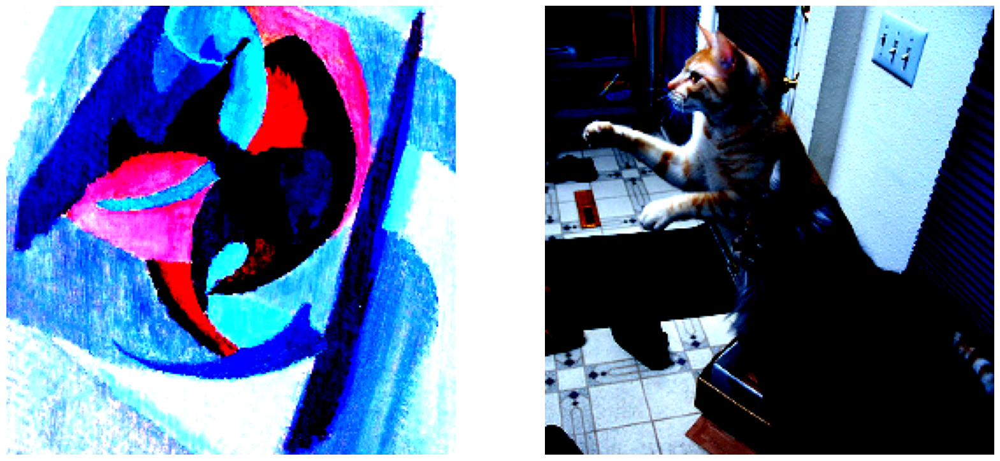

In [97]:
plot_pair(style, content)

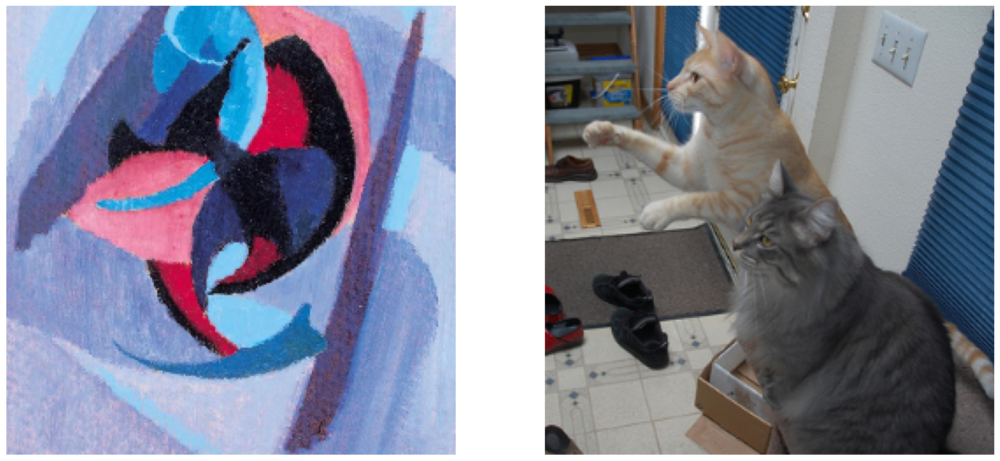

In [98]:
# style, content = denorm_img(style), denorm_img(content)
plot_pair(style, content, denorm=True)

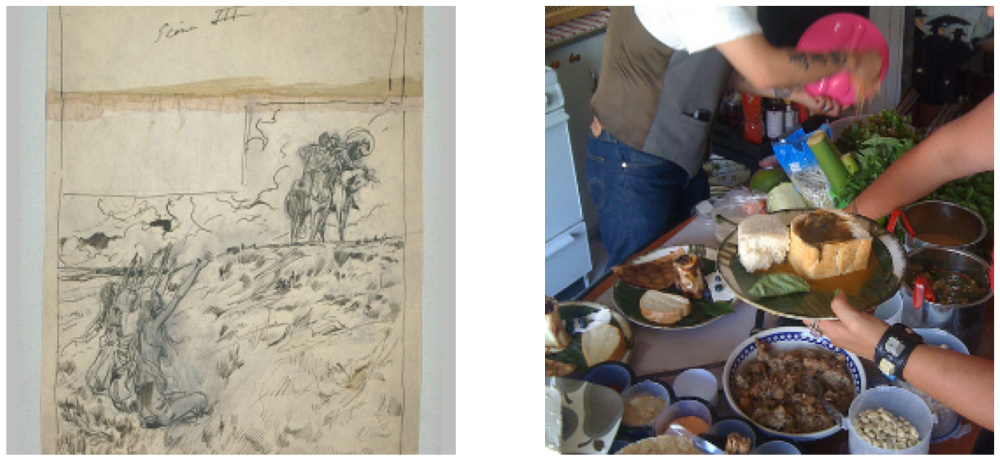

In [101]:
ds = DataStore(train_dataset, batch_size=1)
for i in range(20):
    style, content = ds.get()
    plot_pair(style[0], content[0], denorm=True)
    break